In [1]:
import rsmine.coarsegrainer.cg_optimisers as cg_opt
from rsmine.coarsegrainer.cg_utils import *
from rsmine.coarsegrainer.analysis_utils import *
sys.path.append(os.pardir)
from rsmine.mi_estimator.MI_estimators import VBMI

from examples.AB_prepare_dataset import edges, nodes, nodepos, order_8, G, prepare_data
from analyse_codes import *
import pickle

examples_dir = '.'
regions_data_dir = examples_dir + '/quasiperiodic_data/regions/'

/Users/efe/Documents/Research/RSMI-NE/rsmine/coarsegrainer/build_dataset.py:13: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [2]:
import matplotlib as mpl
from mpl_toolkits.axes_grid1 import make_axes_locatable


cm = 1/2.54 # convert inches to centimeters
fontsize = 7

plt.rc('text', usetex=False)  # True
params = {
    #'text.latex.preamble': r'\usepackage{tgheros}'    # helvetica font
    #                   + r'\usepackage{sansmath}'   # math-font matching  helvetica
    #                   + r'\sansmath'                # actually tell tex to use it!
    #                   + r'\usepackage{siunitx}'    # micro symbols
    #                   + r'\sisetup{detect-all}',    # force siunitx to use the fonts
    'axes.grid': False,
    'savefig.dpi': 400,  # to adjust notebook inline plot size
    'axes.labelsize': fontsize,  # fontsize for x and y labels (was 10)
    'axes.titlesize': fontsize,
    'font.size': fontsize,
    'legend.fontsize': fontsize,  # was 10
    'xtick.labelsize': fontsize,
    'ytick.labelsize': fontsize,
    'text.usetex': False,
    'font.family': 'Arial',
    'figure.facecolor': 'white',
}
mpl.rcParams.update(params)


In [3]:
def small_V_visualize(V_edgelist, edge_densities, edges=None, nodes=None, nodepos=None,
                      n_rows=1, n_cols=1, title="", figsize=(10.4, 6.8), node_size=1, width=3, cmap='bwr',
                      layout_dict={"pad": 0.0, "h_pad": 0.08,
                                   "w_pad": -10.08, "rect": (0, 0, 1, 1)},
                      label_dict=None, edge_vmin=None, edge_vmax=None, savename=None, fontsize=3):
    """
    Plot multicomponent data (filters,PCA components,....) on the V subgraph  (doesn't draw the full system).
    Ensure that number of subplots is equal to the number of data components.
    V_edgelist -- list of edge IDs in V
    edge_densities -- mutlicomponent data to be plotted on V
    """
    # ----- Prepare data, graph, .... --------------
    R = nx.Graph()
    elist = [(edges[e_ind, 0], edges[e_ind, 1], {
              'colors': edge_densities[num, :]}) for num, e_ind in enumerate(V_edgelist)]
    R.add_edges_from(elist)

    num_vtx = np.shape(nodes)[0]
    ndict = {nodes[i]: {'pos': (nodepos[i, 0], nodepos[i, 1])}
             for i in range(num_vtx)}
    nx.set_node_attributes(R, ndict)

    ecolors = [R[u][v]['colors'] for u, v in R.edges()]
    pos_V = nx.get_node_attributes(R, 'pos')

    # ----- Plot subfigures ---------------
    layout_dict = layout_dict
    n_rows = n_rows
    n_cols = n_cols
    if n_rows*n_cols != edge_densities.shape[-1]:
        print("WARNING: num of sublots and components do not match: ",
              n_rows*n_cols, edge_densities.shape[-1])

    fig = plt.figure(tight_layout=layout_dict, figsize=figsize)  # figure(1,)
    axes_plots = []

    for plot_ind in range(1, n_rows*n_cols+1):
        try:
            axes_plots.append(plt.subplot(n_rows, n_cols, plot_ind))
            plt.gca().set_aspect('equal')
            #plt.gca().set_title(title+str(plot_ind))
            nx.draw(R, pos_V, node_color='black',
                    node_size=node_size,
                    edge_color=np.array(ecolors)[:, plot_ind-1],
                    edge_cmap=plt.get_cmap(cmap),
                    width=width, edge_vmin=edge_vmin, edge_vmax=edge_vmax)

            if label_dict is not None:
                nx.draw_networkx_edge_labels(G, pos_V, edge_labels=label_dict, font_size=fontsize)

        except IndexError:
            print("No data components for subplot", plot_ind)

    if savename:
        plt.savefig(savename, bbox_inches='tight')
        plt.close()

    return R


In [4]:
coarse_grainers = {
                    'sigma2': {
                        '8': {389: None},
                        '3': {
                            404: None,
                            399: None,
                            3741: None,
                            7010: None,
                            10286: None,
                            13554: None,
                            16830: None,
                            20098: None
                        },
                    },
                    'sigma4': {
                        '8': {389: None},
                        '3': {
                            196: None,
                            274: None,
                            19899: None,
                            16704: None,
                            13355: None,
                            10160: None,
                            6811: None,
                            3616: None,
                        },
                    }
                }

## Load pre-trained coarse-grainers

Run the following cell to load the pre-trained coarse-grainers.

In [5]:
with open('paper_data/sigma4_coarsegrainers.pickle', 'rb') as handle:
    b = pickle.load(handle)

print(b)

coarse_grainers = b


{'sigma2': {'8': {389: None}, '3': {404: None, 399: None, 3741: None, 7010: None, 10286: None, 13554: None, 16830: None, 20098: None}}, 'sigma4': {'8': {389: array([[ 0.27848175, -0.26871696, -1.0306501 , -0.06541156],
       [-0.3438265 , -0.22312148,  1.1347485 , -0.13245301],
       [ 0.17474516, -0.02940437, -0.1389226 ,  0.19816813],
       ...,
       [ 1.226024  ,  1.2484442 , -1.6994987 , -0.8560633 ],
       [ 0.90690744,  1.8091444 , -1.8788055 , -1.5373672 ],
       [-0.23915207, -0.09877211,  0.16043305,  0.05053719]],
      dtype=float32)}, '3': {196: array([[-0.13640328, -0.05608476],
       [ 0.04323597, -0.02186874],
       [ 0.21450743,  0.24518093],
       ...,
       [ 0.80195427,  0.8406828 ],
       [ 0.64719915,  0.8118989 ],
       [-0.29849502, -0.1744822 ]], dtype=float32), 274: array([[-0.08145602,  0.13663974],
       [ 0.31478158, -0.4130588 ],
       [-0.06935263, -0.05845866],
       ...,
       [ 0.98705006, -0.54879576],
       [ 0.8840354 , -0.62130344]

# Prepare and load the dataset

In [6]:
case_dict = {'sigma2': {'8': {'case_no': 49, 'V_index': 389},
                        '3': {'case_no': 50, 'V_index': 16830}}, 
            'sigma4': {'8': {'case_no': 51, 'V_index': 389},
                        '3': {'case_no': 52, 'V_index': 16704}}} # '3': {'case_no': 18, 'V_index': 196}}}  
                        # TODO: check if 3 is correct


In [7]:
freqs_filtered_all = {}


In [8]:
"""
import sys, importlib
importlib.reload(sys.modules['examples.AB_prepare_dataset'])
from examples.AB_prepare_dataset import edges, nodes, nodepos, order_8, G, prepare_data
"""


"\nimport sys, importlib\nimportlib.reload(sys.modules['examples.AB_prepare_dataset'])\nfrom examples.AB_prepare_dataset import edges, nodes, nodepos, order_8, G, prepare_data\n"

In [34]:
vertex_type = '8'
scale = 'sigma4'

case_no = case_dict[scale][vertex_type]['case_no']
V_index = case_dict[scale][vertex_type]['V_index']  

print(case_no, V_index)

EV_params, data_params, cGV_edges, cGE_edges = prepare_data(V_index)
EV_params['case_no'] = case_no


51 389


/Users/efe/Documents/Research/RSMI-NE/examples/AB_prepare_dataset.py:37: RuntimeWarning: invalid value encountered in scalar divide
  r = (vec[0]*ref_vec[0]+vec[1]*ref_vec[1])/(np.linalg.norm(vec)*np.linalg.norm(ref_vec))


### Highlight the $\mathcal{V}, \mathcal{E}$ subgraph

number of nodes/vertices: (26177,)


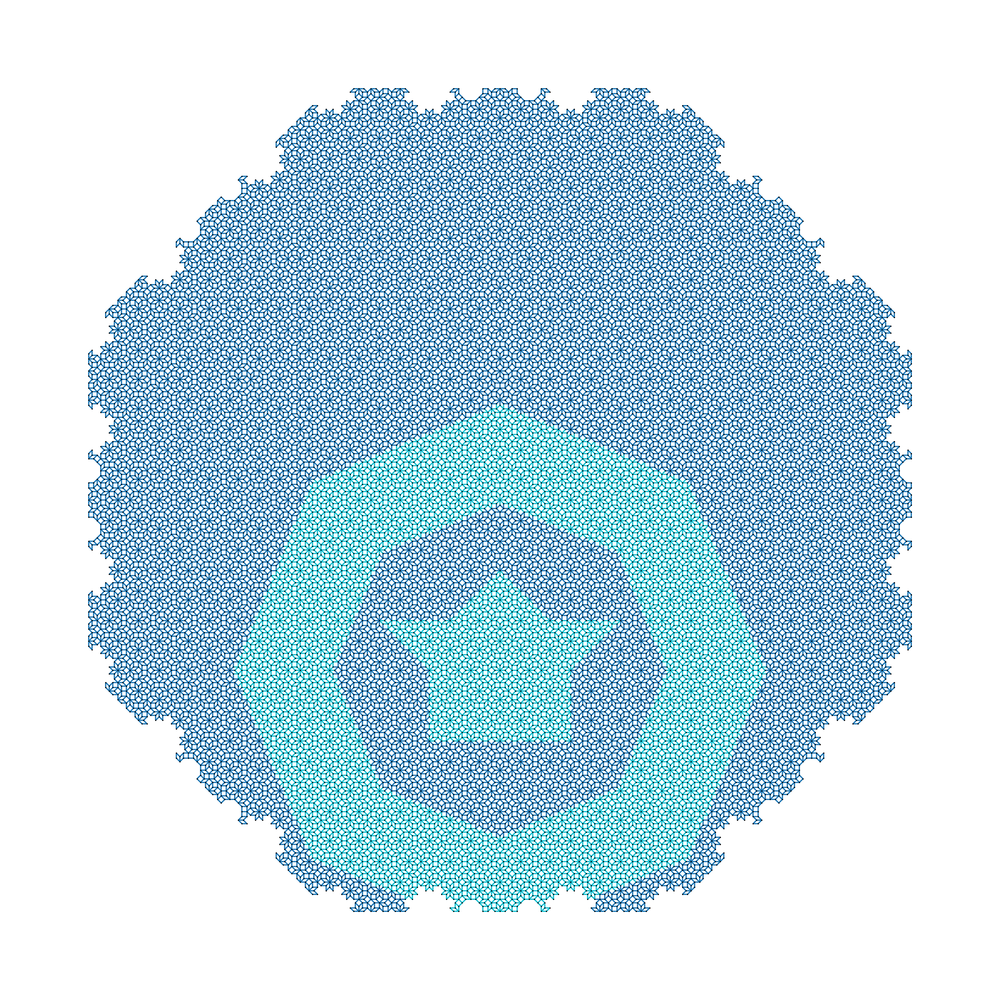

In [ ]:
%matplotlib inline

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

full_graph_visualize(cGV_edges[EV_params['case_no']] + cGE_edges[EV_params['case_no']],
                    edges=edges, nodes=nodes, nodepos=nodepos, cmap='tab10',
                    width=1,  node_size=0.1) #, ax=ax)


### Load the MC samples from the disk

In [35]:
######### Loading the (PRE-EXISTING) E,V data samples ##########
samples = [10705]  # EV_params['sample_seeds']

EV_dir = sample_data_dir = os.path.join('data', 'EandV') 

Es_list=[]
Vs_list=[]

for sample in samples:
    Es_list.append(np.load(os.path.join(EV_dir,"Es_%i_vi%i_c%i.npy" % (sample,EV_params['V_index'],EV_params['case_no']))))
    Vs_list.append(np.load(os.path.join(EV_dir,"Vs_%i_vi%i_c%i.npy" % (sample,EV_params['V_index'],EV_params['case_no']))))
        
Es = np.reshape(Es_list,newshape=(len(Es_list)*Es_list[0].shape[0],Es_list[0].shape[1]))
Vs = np.reshape(Vs_list,newshape=(len(Vs_list)*Vs_list[0].shape[0],Vs_list[0].shape[1], 1)) # REMEMBER about the additional axis for Vs !!!!!
print("shapes: ", Es.shape,Vs.shape)

data_params['N_samples'] = len(Vs) 
print('len(Vs): ',len(Vs))

shapes:  (50000, 11712) (50000, 2760, 1)
len(Vs):  50000


In [36]:
Vs_dict = load_Vs(samples, [EV_params['case_no']],
                  EV_params['V_index'], sample_data_dir)


[10705] 10705
Case: 51, shape Vs:  (50000, 2760, 1)


# Optimisation

## Optimisation hyperparameters

In [13]:
run_no = 0


In [37]:
# Linear CG ansatz

# critic_params specify the MI estimator network -- not likely you need to touch that
# CG_params specify the coarse-grainer
# opt_params the settings of the training algorithm

hidden_dim = 4 #2  # Number of "CG variables"
discrete_var = 1  # 1 # "1" is a "discrete" CG variable, 0 is continuous.
nonlinearCG_layers = [0]

batch_size = 1000  # typically we use 400 or 800
iterations = 50 # 130  # number of epochs

# 8e-4 # 1e-5 # Gumbel-Softmax relaxation rate (from uniform to true categorical distribution)
relaxation_rate = 5e-3
# 8e-4 typically around 1e-4, but can be played with, seems to work in the range [0.2-2. e-4]
learning_rate = 5e-3 #5e-3

# None # pristine_f_l0 # Can be used to feed pre-trained filters.
# 0.5 * purified_filters #filters[-1]  # purified_filters
init_rule = None #0.3*best_filter
##### Setting optimizer params ##########

CG_params = {
    'll': EV_params['block_size'],
    'size_V': Vs.shape[1],
    'init_temperature': 0.3,  # 0.4, # Gumbel-Softmax initial temperature
    'min_temperature': 0.02,  # 0.05, # Gumbel-Softmax min temperature
    'relaxation_rate': relaxation_rate,  # Gumbel-Softmax relaxation rate
    'Nq': None,  # Number of components of the d.o.f.s -- None means they will be set by default to a single component
    # If *not* using Gumbel-Softmax discretisation, this activation will be applied to the output of the coarse-grainer
    'conv_activation': 'softsign',
    'hidden_dim': hidden_dim,  # Number of "CG variables"
    'h_embed': discrete_var,  # True is discrete, False is continuous
    # [0] or None for standard linear CG coupling, a list of stacked dense layer sizes otherwise.
    'nonlinearCG': nonlinearCG_layers,
    # 'relu', # activation function of the *in-between* dense-layers. The last one doesn't have any.
    'hidden_activations': 'swish',
    # 1e-4, # L2 regularization of activations, useful with unbounded activations like relu
    'hidden_activations_L2_reg': 1e-5,
    'batch_norm': False,  # False
    'logit_scale': np.inf,  # 16
    'logit_minscale': 30,  # 30, #3 #8,
    'use_probs': False,
    'use_logits': True,  # True,
    'use_STE': True,  # False,
}

critic_params = {
    'layers': 2,
    'embed_dim': 8,  # 8
    'hidden_dim': 16,  # 32
    'activation': 'swish',  # 'relu',
    'use_dropout': True,
    'dropout_rate': 0.4,  # 0.4,
}

opt_params = {
    "batch_size": batch_size,
    "iterations": iterations,
    "shuffle": len(Vs),
    "learning_rate": learning_rate
}

run_params = {
    # to distinguish independent repetition of the experiment (other parameters being equal)
    "run_no": run_no,
    "use_GPU": True
}

all_params = {}
all_params.update(EV_params)
all_params.update(data_params)
all_params.update(CG_params)
all_params.update(critic_params)
all_params.update(opt_params)
all_params.update(run_params)
print(all_params)


{'env_size': None, 'buffer_size': None, 'block_size': None, 'sample_no': 1070512121, 'sample_seeds': [10705, 12121], 'V_index': 389, 'V_order': 4, 'case_no': 51, 'model': 'dimer_graph', 'lattice_type': 'networkx', 'L': 2048, 'N_samples': 50000, 'dimension': 2, 'll': None, 'size_V': 2760, 'init_temperature': 0.3, 'min_temperature': 0.02, 'relaxation_rate': 0.005, 'Nq': None, 'conv_activation': 'softsign', 'hidden_dim': 16, 'h_embed': 1, 'nonlinearCG': [0], 'hidden_activations': 'swish', 'hidden_activations_L2_reg': 1e-05, 'batch_norm': False, 'logit_scale': inf, 'logit_minscale': 30, 'use_probs': False, 'use_logits': True, 'use_STE': True, 'layers': 2, 'embed_dim': 8, 'activation': 'swish', 'use_dropout': True, 'dropout_rate': 0.4, 'batch_size': 1000, 'iterations': 50, 'shuffle': 50000, 'learning_rate': 0.005, 'run_no': 0, 'use_GPU': True}


  0%|          | 0/2500 [00:00<?, ?it/s]

Len dat:  2500


2023-01-23 11:55:57.919547: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


Training complete.


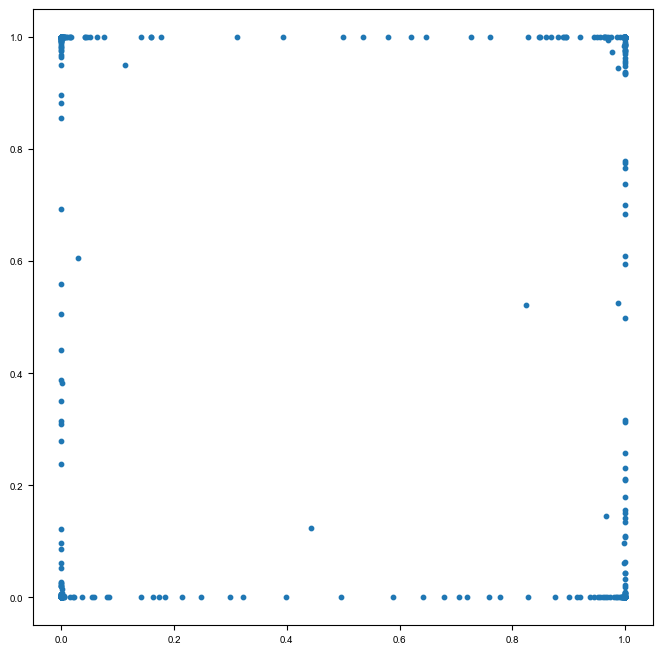

In [2333]:
run_no += 1

############## TRAIN (a single instance) ###############
data_params['N_samples'] = len(Vs)

estimates, Hs, filters, net = cg_opt.train_RSMI_optimiser(CG_params, critic_params, opt_params,
                                                          data_params, E=Es, V=Vs,
                                                          use_GPU=run_params['use_GPU'],
                                                          init_rule=init_rule, use_notebook=True)

if hidden_dim > 1:
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot()
    ax.scatter(Hs[-1, :, 0], Hs[-1, :, 1], s=10)
    

### Crudely visualize the training

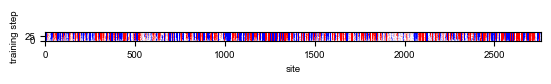

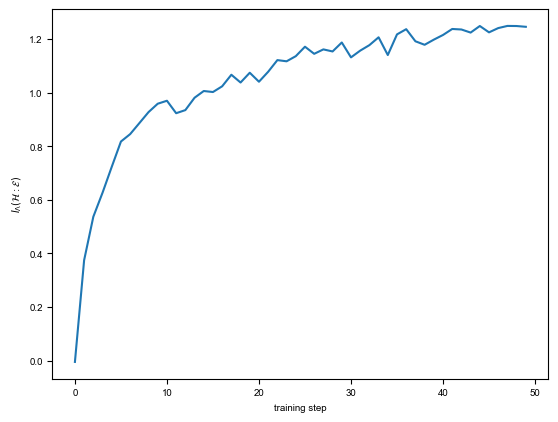

In [2334]:
plt.figure()

# plot the filters (flattened to a 1D array) with time dimension going up:
if len(nonlinearCG_layers) == 1:
    heat = np.array([filters[:, i, 0]
                    for i in range(filters.shape[1])]).transpose()
    plt.imshow(heat, cmap='bwr', interpolation='nearest',
               aspect=1, origin="lower", vmin=-0.2, vmax=0.2)
else:
    heat = np.array([filters[i][0][:, 0] for i in range(len(filters))])
    plt.imshow(heat, cmap='bwr', interpolation='nearest',
               aspect=2, origin="lower", vmin=-0.2, vmax=0.2)
plt.xlabel('site')
plt.ylabel('training step')
plt.show()

%matplotlib inline

# Plot the mutual information (MI) as a function of training step:
plt.figure()

#best_estimate_id = np.nonzero(estimates>1e-1)[0][-1]

plt.plot(estimates)
#plt.axvline(best_estimate_id, color='gray', alpha=0.3)
plt.xlabel('training step')
plt.ylabel(r'$I_\Lambda(\mathcal{H}:\mathcal{E})$')
plt.show()


# Analyse the results

## Visualize the trained networks (coarse graining map)


In [38]:
# uncomment below if you want to analyse previously trained filters

filters = np.array([coarse_grainers[scale][vertex_type][V_index]])


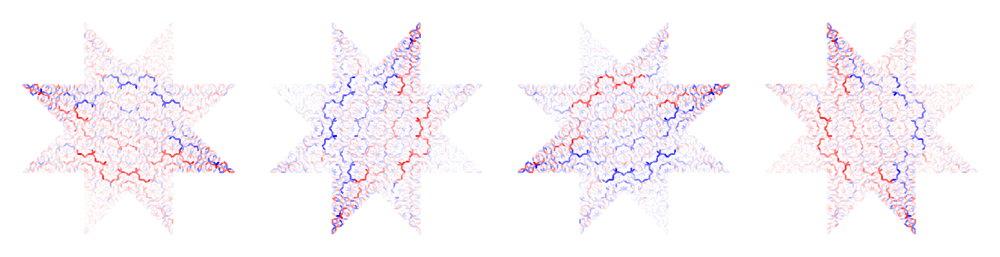

In [39]:
# The nice built-in visualization functions expect this "dictionary of cases" format of inputs.
%matplotlib inline

scale_fac = 2*int(np.ceil(np.cbrt(len(cGV_edges[EV_params['case_no']]))))
if len(nonlinearCG_layers) > 1:
    if nonlinearCG_layers[0] > 20:
        skip = nonlinearCG_layers[0] // 20
        num_cols = 20
    else:
        skip = 1
        num_cols = nonlinearCG_layers[0]

    small_V_visualize(cGV_edges[EV_params['case_no']], filters[-1][0][:, ::skip], edges=edges, nodes=nodes, nodepos=nodepos,
                      n_rows=1, n_cols=num_cols, figsize=(num_cols*scale_fac, 3*scale_fac), title="hidden", width=16,)
else:
    small_V_visualize(cGV_edges[EV_params['case_no']], filters[-1], edges=edges, nodes=nodes, nodepos=nodepos,
                      n_rows=1, n_cols=hidden_dim, figsize=(hidden_dim*scale_fac, 3*scale_fac), title="hidden", width=16)


In [40]:
coarse_grainers[scale][vertex_type][V_index] = filters[-1] 

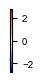

In [41]:

coarse_grainer = coarse_grainers[scale][vertex_type][V_index]

small_V_visualize(cGV_edges[EV_params['case_no']], coarse_grainer, edges=edges, nodes=nodes, nodepos=nodepos,
                  n_rows=1, n_cols=hidden_dim, figsize=(8.9*cm, 1.8*cm), title="hidden", width=0.33, node_size=0,
                  savename=scale+'_'+vertex_type+'v_filters.pdf')


a = np.array([[-np.max(coarse_grainer), np.max(coarse_grainer)]])
plt.figure(figsize=(0.1*cm, 2*cm))
img = plt.imshow(a, cmap="bwr")
plt.gca().set_visible(False)
cax = plt.axes([0.1, 0.1, 0.6, 0.8])
plt.colorbar(orientation="vertical", cax=cax,)
cax.yaxis.set_ticks_position('right')

#plt.savefig("colorbar.pdf", bbox_inches="tight")


### Purify the filters by generating rotated components

In [42]:
best_filter = coarse_grainers[scale][vertex_type][V_index]

filters = np.array([best_filter])


In [43]:
filters = np.array([best_filter])


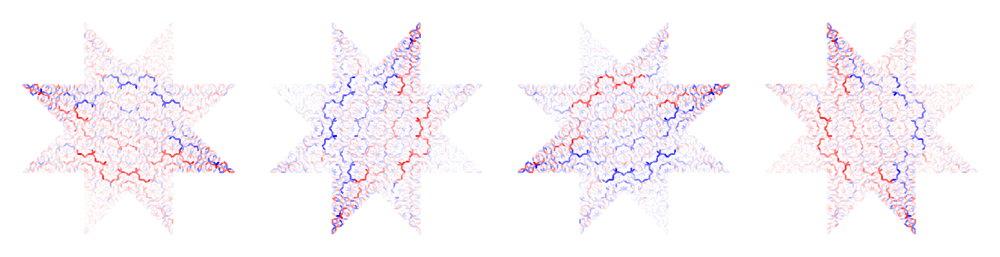

In [44]:
small_V_visualize(cGV_edges[EV_params['case_no']], filters[-1], edges=edges, nodes=nodes, nodepos=nodepos,
                  n_rows=1, n_cols=4, figsize=(hidden_dim*scale_fac, 3*scale_fac),
                  title="hidden", width=16)


In [46]:
angle = np.pi/2

fid = 3

f = []
for i in range(2):
    subarr_pos = rotate_edges(cGV_edges[EV_params['case_no']], i*angle, nodepos, edges, target_vertex=V_index)
    f.append(filters[-1, subarr_pos, fid])


for i in range(2):
    subarr_pos = rotate_edges(cGV_edges[EV_params['case_no']], 5*np.pi/4+i*angle, nodepos, edges, target_vertex=V_index)
    f.append(filters[-1, subarr_pos, fid])

purified_filters = np.array(f).transpose()

small_V_visualize(cGV_edges[EV_params['case_no']], purified_filters, edges=edges, nodes=nodes, nodepos=nodepos,
                  n_rows=1, n_cols=4, figsize=(hidden_dim*scale_fac, 3*scale_fac),
                  title="hidden", width=16)


In [2315]:
coarse_grainers[scale][vertex_type][V_index] = best_filter

### Distribution of pre-activations

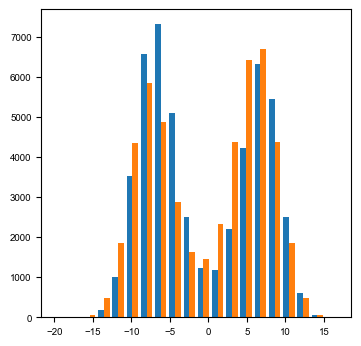

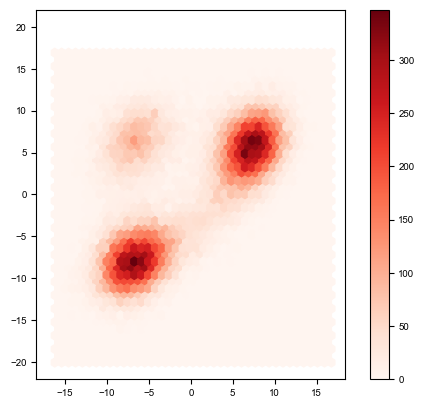

In [ ]:
test_prods = dot_prod_V(Vs_dict[case_no][:, :, 0],
                        None, filters[-1])

fig = plt.figure(figsize=(4, 4))
plt.hist(test_prods[:], bins=20)

hexbin_visualize(test_prods[:, 0], test_prods[:, 1], gridsize=40)


## Analysis of the coarse-grained variables

### Distribution of the variables $\mathcal{H}$

First compute the coarse-grained variables $\mathcal{H}$ for each sample using the optimised map and exact discretisation.

In [ ]:
cond8 = False

if cond8 is True: 
    cond3 = False
else:
    cond3 = True

In [ ]:
vertex_type_corr = '3'
# TODO: handle the case where there are more than one V_index in a given vertex type

if vertex_type_corr == '8':
    V_index_corr = 389
elif vertex_type_corr == '3E':
    V_index_corr = 13355 # (southwest) # TODO: correct this
elif vertex_type_corr == '3NE':
    V_index_corr = 16704  # (south)   # TODO: correct this
elif vertex_type_corr == '3N':
    V_index_corr = 19899  # (southeast)   # TODO: correct this
elif vertex_type_corr == '3NW':
    V_index_corr = 274  # (east)   # TODO: correct this
elif vertex_type_corr == '3W':
    V_index_corr = 196  # (northeast)   # TODO: correct this
elif vertex_type_corr == '3SW':
    V_index_corr = 3616  # (north)   # TODO: correct this
elif vertex_type_corr == '3S':
    V_index_corr = 6811  # (northwest)   # TODO: correct this
elif vertex_type_corr == '3SE':
    V_index_corr = 10160  # (west)   # TODO: correct this

elif vertex_type_corr == '3':
    V_index_corr = case_dict[scale][vertex_type]['V_index']

if vertex_type_corr == '8':
    hidden_dim = 4
elif vertex_type_corr[0] == '3':
    hidden_dim = 2

coarse_grainer = coarse_grainers[scale][vertex_type_corr[0]][V_index_corr]

Vs_dict = load_Vs(samples, [case_dict[scale][vertex_type_corr[0]]['case_no']], V_index_corr, sample_data_dir)


[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)


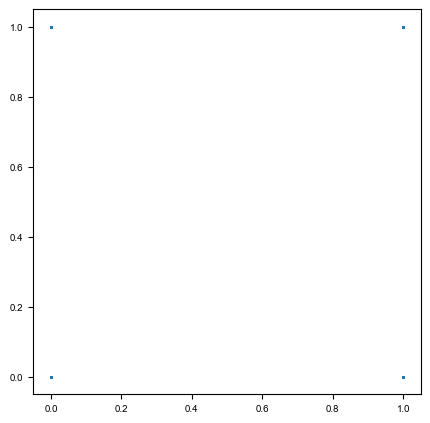

In [ ]:
%matplotlib inline

#case_no = case_no

#test_pr = net(Vs_dict[case_no]).numpy()

test_pr = np.heaviside(dot_prod_V(Vs_dict[case_dict[scale][vertex_type_corr[0]]['case_no']][:, :, 0],
                                  None, coarse_grainer), 0)


fig = plt.figure(figsize=(5, 5))


if hidden_dim > 2:
    ax = fig.add_subplot(projection='3d')
    ax.scatter(test_pr[:, 0], test_pr[:, 1], test_pr[:, 2], s=0.01)
    #ax.set_zlim(-1,1)
    ax.view_init(10, 50)
if hidden_dim == 2:
    ax = fig.add_subplot()
    ax.scatter(test_pr[:, 0], test_pr[:, 1], s=0.01)


### Analyse the statistics of bitstrings

In [ ]:
counts, labels, all_labels, hist = embedding_statistics(test_pr, CG_params)#, hidden_dim)


(-0.5, 3.5)

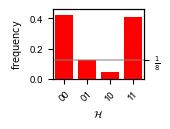

In [ ]:
if hidden_dim == 4:
    fig, ax = plt.subplots(1, figsize=(5.5*cm, 2*cm))
elif hidden_dim == 2:
    fig, ax = plt.subplots(1, figsize=(3*cm, 2.3*cm))

if vertex_type_corr=='8':
    colour = 'b'
elif vertex_type_corr=='3':
    colour = 'r'

freqs = {key: counts[key]/len(test_pr) for key in counts}

ymax = 1.1 * max(freqs.values())

ax.axhline(1/8, color='gray', linestyle='-', label=r'$1/8}$', alpha=0.5)
ax.bar(all_labels, freqs.values(), color=colour,)

ax.set_ylabel(r'${\rm frequency}$')
ax.set_xlabel(r'$\mathcal{H}$')
ax.tick_params(axis='x', labelrotation=45)

ax2 = ax.twinx()
ax2.set_yticks([1/8])
ax2.set_yticklabels([r'$\frac{1}{8}$'])
ax2.set_ylim([0, ymax])
ax.set_ylim([0, ymax])
ax.set_xlim([-.5, 2**hidden_dim - .5])

#plt.savefig(scale+'_'+vertex_type+'v_dist.pdf', dpi=500, bbox_inches='tight')


In [ ]:
freqs = {k: v for k, v in freqs.items() if v > 0.02 }
labels = list(freqs.keys())


In [ ]:
# sort the bitstrings around a cycle (if a unique cycle exists)

sorted_labels = [labels[0]]
temp = labels[1:]

while len(temp) > 0:
    
    for check in temp:
        if hamming2(check, sorted_labels[-1]) == 1:
            sorted_labels.append(check)
            temp.remove(check)
            break

if vertex_type_corr == '8':
    sorted_labels_8 = sorted_labels

sorted_labels


['00', '01', '11', '10']

# Analysis of the correlations

Filter the samples in the current coarse graining according to the labels in the previous coarse graining.


In [ ]:
dir_dict = {0: [0, 0, 1], 1: [1, 0, 0], 2: [0, 1, 0]}

In [ ]:
state = 1

if cond3:
    symbol = list(CGfilter_corrr.keys())[state]
    str_symbol = "".join(map(str, (0.5*(np.array(symbol)+1)).astype(int)))
elif cond8:
    str_symbol = sorted_labels_8[state]
    symbol = tuple([int(char) for char in str_symbol])


print('Filtering current representation for symbol',
      symbol,
      'from previous run.')


Hs_filtered = test_pr[CGfilter_corrr[symbol]]
#print(row_counter(Hs_filtered))

counts_filtered, labels_filtered, _, _ = embedding_statistics(Hs_filtered, CG_params)


freqs_filtered = {key: counts_filtered[key]/len(Hs_filtered) for key in counts}

fig, ax = plt.subplots(1, figsize=(6, 3))

ax.bar(all_labels, freqs_filtered.values())
ax.set_ylabel(r'$P(\mathcal{H}|h_3='+str_symbol+')$')
ax.set_xlabel('$\mathcal{H}$')

ax.tick_params(axis='x', labelrotation=45)


NameError: name 'CGfilter_corrr' is not defined

In [ ]:
freqs_filtered


NameError: name 'freqs_filtered' is not defined

### Create a sample filter for the labels (Don't update this after each optimisation!)

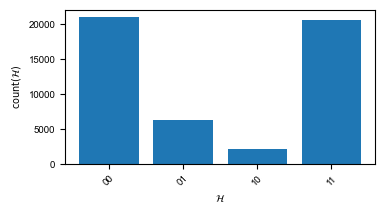

In [ ]:
#%matplotlib notebook

fig, ax = plt.subplots(1, figsize=(4, 2))

ax.bar(all_labels, counts.values())
ax.set_ylabel(r'${\rm count}(\mathcal{H})$')
ax.set_xlabel(r'$\mathcal{H}$')

ax.tick_params(axis='x', labelrotation=45)


In [32]:
CGfilter_corrr = dict()

# returns the sample indices with given CG state
for str_symbol in freqs.keys():
    label = tuple([int(char) for char in str_symbol])
    if CG_params['use_logits']:
        CGfilter_corrr[label] = np.where(
            np.all(np.heaviside(test_pr-0.5, 0) == list(label), axis=1))[0]
    else:
        CGfilter_corrr[label] = np.where(
            np.all(np.sign(test_pr) == list(label), axis=1))[0]

CGfilter_corrr


{(0, 0): array([    0,     1,     2, ..., 49997, 49998, 49999]),
 (0, 1): array([    3,     9,    12, ..., 49961, 49975, 49987]),
 (1, 0): array([   11,    62,   126, ..., 49881, 49952, 49994]),
 (1, 1): array([    4,     5,     7, ..., 49991, 49992, 49995])}

## Streamline correlation analysis

Define functions to analyse the coarse-grained codes, automate identification of clock variables and compute correlations.

In [1987]:
coarse_grainers[scale][vertex_type[0]].keys()


dict_keys([196, 274, 16704, 13355, 19899, 10160, 6811, 3616])

In [1988]:
def sort_bitstrings(labels):

    # sort the bitstrings around a cycle (if a unique cycle exists)
    sorted_labels = [labels[0]]
    temp = labels[1:]

    while len(temp) > 0:

        for check in temp:
            if hamming2(check, sorted_labels[-1]) == 1:
                sorted_labels.append(check)
                temp.remove(check)
                break

    return sorted_labels

def samples2bitstrings(vertex_type: str, sparse_freqs: bool = True):
    """
    state: conditioning state
    vertex_type_corr: vertex type that will be filtered
    cond8: if the contitioning vertex an 8-vertex

    """

    if vertex_type == '8':
        V_index_corr = 389
    elif vertex_type == '3E':
        V_index_corr = 13355  # (southwest)
    elif vertex_type == '3NE':
        V_index_corr = 16704  # (south)
    elif vertex_type == '3N':
        V_index_corr = 19899  # (southeast)
    elif vertex_type == '3NW':
        V_index_corr = 274  # (east)
    elif vertex_type == '3W':
        V_index_corr = 196  #  (northeast)
    elif vertex_type == '3SW':
        V_index_corr = 3616  # (north)
    elif vertex_type == '3S':
        V_index_corr = 6811  # (northwest)
    elif vertex_type == '3SE':
        V_index_corr = 10160  # (west)
    else:
        raise ValueError('vertex_type_corr not recognized')


    if vertex_type == '8':
        hidden_dim = 4
    elif vertex_type[0] == '3':
        hidden_dim = 2

    coarse_grainer = coarse_grainers[scale][vertex_type[0]][V_index_corr]

    Vs_dict = load_Vs(samples, [
                      case_dict[scale][vertex_type[0]]['case_no']], V_index_corr, sample_data_dir)

    test_pr = np.heaviside(dot_prod_V(Vs_dict[case_dict[scale][vertex_type[0]]['case_no']][:, :, 0],
                                      None, coarse_grainer), 0)

    counts, labels, all_labels, hist = embedding_statistics(test_pr, CG_params, hidden_dim=hidden_dim)
    freqs = {key: counts[key]/len(test_pr) for key in counts}

    if sparse_freqs:
        freqs = {k: v for k, v in freqs.items() if v > 0.02}

    return freqs, test_pr, hist


In [1989]:
def create_sample_filter(vertex_type_corr: str):

    freqs, test_pr, hist = samples2bitstrings(vertex_type_corr)

    CGfilter_corrr = dict()

    # returns the sample indices with given CG state
    for str_symbol in freqs.keys():
        label = tuple([int(char) for char in str_symbol])
        if CG_params['use_logits']:
            CGfilter_corrr[label] = np.where(
                np.all(np.heaviside(test_pr-0.5, 0) == list(label), axis=1))[0]
        else:
            CGfilter_corrr[label] = np.where(
                np.all(np.sign(test_pr) == list(label), axis=1))[0]

    return CGfilter_corrr


In [1990]:
def filter_bitstrings(state: int, vertex_type_corr:str, CGfilter_corrr: dict, cond8: bool=False):
    """
    state: conditioning state for the filter
    vertex_type: type of vertex which will be filtered
    CG_filter_corrr: filter holding the sample dictionary

    """

    if cond8 is True: 
        cond3 = False
    else:
        cond3 = True
        

    if vertex_type_corr == '8':
        hidden_dim = 4
    elif vertex_type_corr[0] == '3':
        hidden_dim = 2
    
    
    if cond8:
        sorted_labels_8 = sort_bitstrings(["".join(map(str, (0.5*(np.array(symbol)+1)).astype(int))) 
                                                                for symbol in CGfilter_corrr.keys()])
        str_symbol = sorted_labels_8[state]
        symbol = tuple([int(char) for char in str_symbol])
        
    elif cond3:
        symbol = list(CGfilter_corrr.keys())[state]
        str_symbol = "".join(map(str, (0.5*(np.array(symbol)+1)).astype(int)))
    
    _, test_pr, _ = samples2bitstrings(vertex_type_corr)
    Hs_filtered = test_pr[CGfilter_corrr[symbol]]

    counts_filtered, labels_filtered, _, _ = embedding_statistics(Hs_filtered, CG_params, hidden_dim=hidden_dim)

    freqs_filtered = {key: counts_filtered[key]/len(Hs_filtered) for key in counts_filtered}

    return freqs_filtered

In [1991]:
def filter_all_vertices(state: int, CGfilter_corrr: dict, cond8: bool = False,
                        vertices=['3E', '3SE', '3S', '3SW', '3W', '3NW', '3N', '3NE']):

    freqs_filtered_all = {}

    vertex_type_corr = '8'

    freqs, _, _ = samples2bitstrings(vertex_type_corr, sparse_freqs=True)
    labels = list(freqs.keys())
    sorted_labels = sort_bitstrings(labels)

    freqs_filtered = filter_bitstrings(state, vertex_type_corr, CGfilter_corrr, cond8=cond8)
    #print('debugging', freqs_filtered)

    freqs_filtered_cleaned = {}
    for label in sorted_labels:
        freqs_filtered_cleaned[label] = freqs_filtered[label]

    freqs_filtered_all[vertex_type_corr] = freqs_filtered_cleaned



    for vertex_type_corr in vertices:#['3E', '3NE']:

        freqs, _, _ = samples2bitstrings(vertex_type_corr, sparse_freqs=True)
        labels = list(freqs.keys())
        sorted_labels = sort_bitstrings(labels)
        freqs_filtered = filter_bitstrings(state, vertex_type_corr, CGfilter_corrr, cond8=cond8)

        """
        freqs_cleaned = freqs.copy()
        sorted_labels_cleaned = sorted_labels.copy()

        spurious_code = min(freqs_cleaned, key=freqs_cleaned.get)

        print(
            f'will now remove {spurious_code} with frequency {freqs_cleaned[spurious_code]}')

        del freqs_cleaned[spurious_code]
        sorted_labels_cleaned.remove(spurious_code)

        #print(freqs_cleaned)
        #print(sorted_labels_cleaned)


        freqs_filtered_cleaned = {}

        for label in sorted_labels_cleaned:
            freqs_filtered_cleaned[label] = freqs_filtered[label]
        """

        freqs_filtered_all[vertex_type_corr] = freqs_filtered#_cleaned

    return freqs_filtered_all

In [1992]:
def construct_correlation_graph(freqs_filtered_all: dict, cond8: bool=False,
                                compass_dict=None, ref_dirs=None, cond_dir = None,
                                dimer_width=4,
                                dw_eps=0.8,
                                l_width=0.1,
                                ncolor='grey',
                                nsize=45,
                                ccolor='darkorange',
                                ax=None,
                                colorbar: bool=False,
                                cpermute=0,
                                cflip=False,):

    if cond8 is True:
        cond3 = False

    else:
        cond3 = True



    if ref_dirs is None:
        ref_dirs = np.array(['3E', '3SE', '3S', '3SW', '3W', '3NW', '3N', '3NE'])

    if cond_dir is None:
        cond_dir = '3NE'

    ref_dir_dict = {'3N':  3730, '3NE': 390, '3E': 388, '3SE': 20090,
                    '3S': 16818, '3SW': 13546, '3W': 10274, '3NW': 7002,
                    '8': 389}

    
    edges_dict = {389: [796, 797, 798, 799, 800, 801, 802, 803],
                390: [797, 793, 7438],
                388: [796, 46282, 792],
                20090: [803, 39810, 46284],
                16818: [802, 33336, 39808],
                13546: [801, 26862, 33334],
                10274: [800, 20388, 26860],
                7002: [799, 13914, 20386],
                3730: [798, 7440, 13912]}  # TODO: make sure the edges are ordered counter-clockwise!!


    if compass_dict is None:
        # Dictionary of oriented clock states (sorted CCW) at each 3-vertex (denoted by direction)
        # TODO: construct this dictionary automatically
        compass_dict = {'3E': ['11', '10', '01'],
                        '3NE': ['01', '11', '00'],
                        '3N': ['00', '10', '01'],
                        '3NW': ['11', '01', '10'],
                        '3W': ['10', '11', '00'],
                        '3SW': ['11', '10',  '01'],
                        '3S': ['00', '10', '01'],
                        '3SE': ['11', '10', '01']}


    corr_graphs = {}

    # central 8-vertex:
    node_id = ref_dir_dict['8']
    V_edgelist = region_of_interest = edges_dict[node_id]

    if cond8:
        A = np.zeros(8)
        A[state] = 1
        edge_densitiesc = A
    elif cond3:
        edge_densitiesc = np.array(list(freqs_filtered_all['8'].values()))

    # TODO: make sure this is correct and safe!
    #permute = np.where(ref_dirs == cond_dir)[0][0] - np.argmax(edge_densitiesc)
    #print(permute)
    edge_densitiesc = np.roll(edge_densitiesc, cpermute) #np.flip(np.roll(edge_densitiesc, 0))
    if cflip:
        edge_densitiesc = np.flip(edge_densitiesc)
    

    Rc = nx.Graph()
    elist = [(edges[e_ind, 0], edges[e_ind, 1], {
            'colors': edge_densitiesc[num]}) for num, e_ind in enumerate(V_edgelist)]
    Rc.add_edges_from(elist)

    num_vtx = np.shape(nodes)[0]
    ndict = {nodes[i]: {'pos': (nodepos[i, 0], nodepos[i, 1])}
            for i in range(num_vtx)}
    nx.set_node_attributes(Rc, ndict)

    pos_Vc = nx.get_node_attributes(Rc, 'pos')
    node_id = 389
    pos_V_scaledc = pos_Vc.copy()
    for node, pos in pos_Vc.items():
        if node != node_id:
            scaled_pos = 0.5 * (np.array(pos) + np.array(pos_Vc[node_id]))
            print(scaled_pos)

            pos_V_scaledc[node] = tuple(scaled_pos)

    corr_graphs['8'] = (Rc, pos_Vc, pos_V_scaledc, edge_densitiesc)


    # 3-vertices:

    for dir in ref_dirs:
        node_id = ref_dir_dict[dir]
        print(dir, node_id)

        V_edgelist = region_of_interest = edges_dict[node_id]
        print(region_of_interest)

        if dir == cond_dir:
            if cond3 and dir[0]=='3':
                symbol = list(CGfilter_corrr.keys())[state]
                str_symbol = "".join(map(str, (0.5*(np.array(symbol)+1)).astype(int)))
                
                direction = np.where(np.array(compass_dict[dir]) == str_symbol)[0][0]
                edge_densities1 = np.zeros(3)
                edge_densities1[direction] = 1
            elif cond8:
                edge_densities1 = np.array([freqs_filtered_all[dir][k] for k in compass_dict[dir]])

        else:
            print(dir)
            edge_densities1 = np.array([freqs_filtered_all[dir][k] for k in compass_dict[dir]])
            

        R1 = nx.Graph()
        elist = [(edges[e_ind, 0], edges[e_ind, 1], {
                'colors': edge_densities1[num]}) for num, e_ind in enumerate(V_edgelist)]
        R1.add_edges_from(elist)

        num_vtx = np.shape(nodes)[0]
        ndict = {nodes[i]: {'pos': (nodepos[i, 0], nodepos[i, 1])}
                for i in range(num_vtx)}
        nx.set_node_attributes(R1, ndict)

        pos_V1 = nx.get_node_attributes(R1, 'pos')

        pos_V_scaled1 = pos_V1.copy()
        for node, pos in pos_V1.items():
            if node != node_id:
                scaled_pos = 0.5 * (np.array(pos) + np.array(pos_V1[node_id]))
                print(scaled_pos)

                pos_V_scaled1[node] = tuple(scaled_pos)

        corr_graphs[dir] = (R1, pos_V1, pos_V_scaled1, edge_densities1)



    # Plot the graph
    #fig, ax = plt.subplots(figsize=(5*cm, 5.5*cm))
    ax = ax or plt.gca()
    ax.set_aspect('equal')

    for corr_graph in corr_graphs.values():
        nx.draw(corr_graph[0], corr_graph[1], 
                node_color=ncolor,
                edge_color='grey',
                width=l_width, 
                node_size=nsize, ax=ax)



    for dir in corr_graphs.keys():
        R, pos_V, pos_V_scaled, edge_densities = corr_graphs[dir]
        nx.draw_networkx_edges(R, pos_V_scaled,
                            edge_color='k', width=dimer_width+dw_eps)

        if dir == '8':
            continue
        elif dir == cond_dir:
            if cond3:
                nx.draw(R, pos_V_scaled, node_color=ncolor,
                        edge_color=edge_densities,
                        edge_cmap=mpl.colors.LinearSegmentedColormap.from_list(
                            '', ['white', ccolor]), linewidths=10,
                        edge_vmin=0, edge_vmax=1,
                        width=dimer_width, node_size=0, ax=ax)
            elif cond8:
                nx.draw(R, pos_V_scaled, node_color=ncolor,
                        edge_color=edge_densities,
                        edge_cmap=plt.cm.Greys, linewidths=10,
                        edge_vmin=0, edge_vmax=1,
                        width=dimer_width, node_size=0, ax=ax)
        else:
            nx.draw(R, pos_V_scaled, node_color=ncolor,
                    edge_color=edge_densities,
                    edge_cmap=plt.cm.Greys, linewidths=10,
                    edge_vmin=0, edge_vmax=1,
                    width=dimer_width, node_size=0, ax=ax)
            



    Rc, _, pos_V_scaledc, edge_densitiesc = corr_graphs['8']

    if cond3:
        im = nx.draw(Rc, pos_V_scaledc, node_color=ncolor,
                    edge_color=edge_densitiesc,
                    edge_cmap=plt.cm.Greys,
                    edge_vmin=0, edge_vmax=1,
                    width=dimer_width, node_size=0, ax=ax)
    elif cond8:
        im = nx.draw(Rc, pos_V_scaledc, node_color=ncolor,
                    edge_color=edge_densitiesc,
                    edge_cmap=mpl.colors.LinearSegmentedColormap.from_list(
                        '', ['white', ccolor]),
                    edge_vmin=0, edge_vmax=1,
                    width=dimer_width, node_size=0, ax=ax)




In [1993]:
def construct_correlation_graph_(freqs_filtered_all: dict, cond8: bool=False,
                                dimer_width=4,
                                dw_eps=0.8,
                                l_width=0.1,
                                ncolor='grey',
                                nsize=45,
                                ccolor='cyan',
                                ax=None,
                                colorbar:bool=False):

    dir_dict = {0: [0, 0, 1], 1: [1, 0, 0], 2: [1,1,1], 3: [0, 1, 0]}

                                
    # Node 196

    V_edgelist = region_of_interest = edges_dict[196]
    print(region_of_interest)

    if cond8 is True:
        cond3 = False
        edge_densities1 = np.roll(
            np.array(list(freqs_filtered_all['3NE'].values())), 2)
    else:
        cond3 = True
        edge_densities1 =  dir_dict[state]



    R1 = nx.Graph()
    elist = [(edges[e_ind, 0], edges[e_ind, 1], {
            'colors': edge_densities1[num]}) for num, e_ind in enumerate(V_edgelist)]
    R1.add_edges_from(elist)

    num_vtx = np.shape(nodes)[0]
    ndict = {nodes[i]: {'pos': (nodepos[i, 0], nodepos[i, 1])}
            for i in range(num_vtx)}
    nx.set_node_attributes(R1, ndict)

    pos_V1 = nx.get_node_attributes(R1, 'pos')

    node_id = 390
    pos_V_scaled1 = pos_V1.copy()
    for node, pos in pos_V1.items():
        if node != node_id:
            scaled_pos = 0.5 * \
                (np.array(pos) -
                np.array(pos_V1[node_id])) + np.array(pos_V1[node_id])
            print(scaled_pos)

            pos_V_scaled1[node] = tuple(scaled_pos)


    # Node 274

    V_edgelist = region_of_interest = edges_dict[274]
    print(region_of_interest)
    edge_densities0 = np.array(list(freqs_filtered_all['3E'].values()))

    edge_densities0 = np.roll(edge_densities0, -1)


    R0 = nx.Graph()
    elist = [(edges[e_ind, 0], edges[e_ind, 1], {
            'colors': edge_densities0[num]}) for num, e_ind in enumerate(V_edgelist)]
    R0.add_edges_from(elist)

    num_vtx = np.shape(nodes)[0]
    ndict = {nodes[i]: {'pos': (nodepos[i, 0], nodepos[i, 1])}
            for i in range(num_vtx)}
    nx.set_node_attributes(R0, ndict)

    pos_V0 = nx.get_node_attributes(R0, 'pos')

    node_id = 388
    pos_V_scaled0 = pos_V0.copy()
    for node, pos in pos_V0.items():
        if node != node_id:
            scaled_pos = 0.5 * \
                (np.array(pos) -
                np.array(pos_V0[node_id])) + np.array(pos_V0[node_id])
            print(scaled_pos)

            pos_V_scaled0[node] = tuple(scaled_pos)


    # Node 389

    V_edgelist = region_of_interest = edges_dict[389]
    print(region_of_interest)


    if cond8:
        A = np.zeros(8)
        A[state] = 1
        edge_densitiesc = A
        #edge_densitiesc = np.roll(edge_densitiesc, 4)
    elif cond3:
        edge_densitiesc = np.array(list(freqs_filtered_all['8'].values()))

    permute = np.where(ref_dirs == cond_dir)[0][0] - np.argmax(edge_densitiesc)
    print(permute)
    edge_densitiesc = np.roll(edge_densitiesc, 5) #np.flip(np.roll(edge_densitiesc, 2))

    Rc = nx.Graph()
    elist = [(edges[e_ind, 0], edges[e_ind, 1], {
            'colors': edge_densitiesc[num]}) for num, e_ind in enumerate(V_edgelist)]
    Rc.add_edges_from(elist)

    num_vtx = np.shape(nodes)[0]
    ndict = {nodes[i]: {'pos': (nodepos[i, 0], nodepos[i, 1])}
            for i in range(num_vtx)}
    nx.set_node_attributes(Rc, ndict)

    pos_Vc = nx.get_node_attributes(Rc, 'pos')
    node_id = 389
    pos_V_scaledc = pos_Vc.copy()
    for node, pos in pos_Vc.items():
        if node != node_id:
            scaled_pos = 0.5 * \
                (np.array(pos) -
                np.array(pos_Vc[node_id])) + np.array(pos_Vc[node_id])
            print(scaled_pos)

            pos_V_scaledc[node] = tuple(scaled_pos)





    
    # Plot the correlation graph
    
    #fig, ax = plt.subplots(figsize=figsize)
    ax = ax or plt.gca()

    ax.set_aspect('equal')

    nx.draw(R1, pos_V1, node_color=ncolor,
            edge_color='grey',
            width=l_width, node_size=nsize, ax=ax)

    nx.draw(R0, pos_V0, node_color=ncolor,
            edge_color='grey',
            width=l_width, node_size=nsize, ax=ax)

    nx.draw(Rc, pos_Vc, node_color=ncolor,
            edge_color='grey',
            width=l_width, node_size=nsize, ax=ax)


    nx.draw_networkx_edges(R1, pos_V_scaled1,
                        edge_color='k', width=dimer_width+dw_eps)

    if cond3:
        nx.draw(R1, pos_V_scaled1, node_color=ncolor,
                edge_color=edge_densities1,
                edge_cmap=mpl.colors.LinearSegmentedColormap.from_list(
                '', ['white', ccolor]), linewidths=10,
                edge_vmin=0, edge_vmax=1,
                width=dimer_width, node_size=0, ax=ax)
    elif cond8:
        nx.draw(R1, pos_V_scaled1, node_color=ncolor,
                edge_color=edge_densities1,
                edge_cmap=plt.cm.Greys, linewidths=10,
                edge_vmin=0, edge_vmax=1,
                width=dimer_width, node_size=0, ax=ax)


    nx.draw_networkx_edges(R0, pos_V_scaled0,
                        edge_color='k', width=dimer_width+dw_eps)


    nx.draw(R0, pos_V_scaled0, node_color=ncolor,
            edge_color=edge_densities0,
            edge_cmap=plt.cm.Greys,
            edge_vmin=0, edge_vmax=1,
            width=dimer_width, node_size=0, ax=ax)

    nx.draw_networkx_edges(Rc, pos_V_scaledc,
                        edge_color='k', width=dimer_width+dw_eps)

    if cond3:
        im = nx.draw(Rc, pos_V_scaledc, node_color=ncolor,
                edge_color=edge_densitiesc,
                edge_cmap=plt.cm.Greys,
                edge_vmin=0, edge_vmax=1,
                width=dimer_width, node_size=0, ax=ax)
    elif cond8:
        im = nx.draw(Rc, pos_V_scaledc, node_color=ncolor,
                edge_color=edge_densitiesc,
                edge_cmap=mpl.colors.LinearSegmentedColormap.from_list(
                            '', ['white', ccolor]),
                edge_vmin=0, edge_vmax=1,
                width=dimer_width, node_size=0, ax=ax)


## Compute the correlations

[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
Condition: (0, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 51, shape Vs:  (50000, 2760, 1)
[10705] 10705
Case: 51, shape Vs:  (50000, 2760, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 214

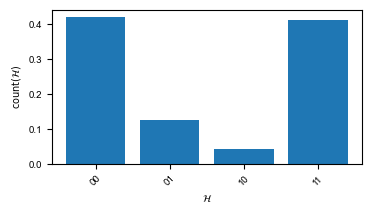

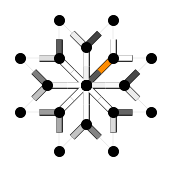

In [2371]:
state = 1
cond_loc = '3NE'

CGfilter_corrr = create_sample_filter(cond_loc)

if cond_loc == '8':
    cond8 = True
    hdim = 4

    sorted_labels_8 = sort_bitstrings(["".join(map(str, (0.5*(np.array(symbol)+1)).astype(int)))
                                       for symbol in CGfilter_corrr.keys()])
    print('Condition:', sorted_labels_8[state])
        
else:
    cond8 = False
    hdim = 2

    print('Condition:', list(CGfilter_corrr.keys())[state])


freqs, test_pr, hist = samples2bitstrings(cond_loc, sparse_freqs=False)
fig, ax = plt.subplots(1, figsize=(4, 2))
ax.bar(genbitstrings(hdim), freqs.values())
ax.set_ylabel(r'${\rm count}(\mathcal{H})$')
ax.set_xlabel(r'$\mathcal{H}$')
ax.tick_params(axis='x', labelrotation=45)


figsize = (5*cm, 5*cm)
fig = plt.figure(figsize=figsize)
ax1 = fig.add_subplot(1, 1, 1)



freqs_filtered_all = filter_all_vertices(state, CGfilter_corrr, cond8=cond8)

construct_correlation_graph(
    freqs_filtered_all, cond8=cond8, ax=ax1, ccolor=ccolor, ncolor=ncolor, cpermute=5)


### Generate $\sigma^{-4}$ part of Fig.4

[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 51, shape Vs:  (50000, 2760, 1)
[10705] 10705
Case: 51, shape Vs:  (50000, 2760, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[0.5 0. ]
[0

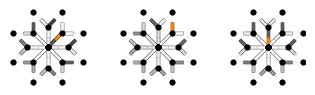

In [2373]:
from matplotlib.gridspec import GridSpec
%matplotlib inline

num_cols = 3
figsize = (3.6*num_cols*cm, 2.5*cm)
fig = plt.figure(figsize=figsize)


dimer_width = 2
dw_eps = 0.5
l_width = 0.1
ncolor = 'black'
nsize = 10
ccolor = 'darkorange'


k = 1
for (cond_loc, state) in [('3NE', 1), ('3NE', 0), ('8', 5)]:
    if cond_loc == '3NE':
        cond8 = False
        cond3 = True
    elif cond_loc == '8':
        cond8 = True
        cond3 = False

    CGfilter_corrr = create_sample_filter(cond_loc)
    freqs_filtered_all = filter_all_vertices(
        state, CGfilter_corrr, cond8=cond8,
        vertices=['3E', '3SE', '3S', '3SW', '3W', '3NW', '3N', '3NE'])

    ax = fig.add_subplot(1, num_cols, k)
    ax.margins(0.015, 0.015)
    construct_correlation_graph(freqs_filtered_all, cond8=cond8,
                                ax=ax,
                                dimer_width=dimer_width,
                                dw_eps=dw_eps,
                                l_width=l_width,
                                ncolor=ncolor,
                                nsize=nsize,
                                ccolor=ccolor, cpermute=5)
    k += 1

#plt.tight_layout()
plt.subplots_adjust(wspace=0.0, hspace=0.0)
plt.savefig('sigma4_correlations_all.pdf', dpi=300, bbox_inches='tight')


In [ ]:
_, _, cGV_edges_, _ = prepare_data(389)

vertex_type_ = '8'

edge_densities = coarse_grainers[scale]['8'][case_dict[scale][vertex_type_]['V_index']]  # filters[-1]
V_edgelist = cGV_edges_[case_dict[scale][vertex_type_]['case_no']]

R = nx.Graph()
elist = [(edges[e_ind, 0], edges[e_ind, 1], {
    'colors': edge_densities[num, :]}) for num, e_ind in enumerate(V_edgelist)]
R.add_edges_from(elist)

num_vtx = np.shape(nodes)[0]
ndict = {nodes[i]: {'pos': (nodepos[i, 0], nodepos[i, 1])}
         for i in range(num_vtx)}
nx.set_node_attributes(R, ndict)

ecolors = [R[u][v]['colors'] for u, v in R.edges()]
pos_V = nx.get_node_attributes(R, 'pos')


/Users/efe/Documents/Research/RSMI-NE/examples/AB_prepare_dataset.py:37: RuntimeWarning: invalid value encountered in double_scalars
  return 0


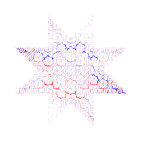

In [ ]:
fig, ax = plt.subplots(1, figsize=(4*cm, 4*cm))
ax.set_aspect('equal')
ax.margins(0, 0)
nx.draw(R, pos_V, node_color='black',
        node_size=0,
        edge_color=np.array(ecolors)[:, 0],
        edge_cmap=plt.get_cmap('bwr'),
        width=0.3*dimer_width, edge_vmin=-np.max(edge_densities), edge_vmax=np.max(edge_densities))

plt.subplots_adjust(wspace=0.1, hspace=0.1)

plt.savefig('sigma4_filter_component.pdf', dpi=300, bbox_inches='tight')


### Old figures

In [ ]:
vertex_type_ = '8'

edge_densities = coarse_grainers[scale]['8'][case_dict[scale]
                                             [vertex_type_]['V_index']]  # filters[-1]
V_edgelist = cGV_edges[case_dict[scale][vertex_type_]['case_no']]

R = nx.Graph()
elist = [(edges[e_ind, 0], edges[e_ind, 1], {
    'colors': edge_densities[num, :]}) for num, e_ind in enumerate(V_edgelist)]
R.add_edges_from(elist)

num_vtx = np.shape(nodes)[0]
ndict = {nodes[i]: {'pos': (nodepos[i, 0], nodepos[i, 1])}
         for i in range(num_vtx)}
nx.set_node_attributes(R, ndict)

ecolors = [R[u][v]['colors'] for u, v in R.edges()]
pos_V = nx.get_node_attributes(R, 'pos')


[10705] 10705
Case: 50, shape Vs:  (50000, 67, 1)
[10705] 10705
Case: 49, shape Vs:  (50000, 88, 1)
[10705] 10705
Case: 49, shape Vs:  (50000, 88, 1)
debugging {'0000': 0.0, '0001': 0.0, '0010': 0.00016758840288252054, '0011': 0.1452991452991453, '0100': 0.00016758840288252054, '0101': 0.0, '0110': 0.00016758840288252054, '0111': 0.0, '1000': 0.0, '1001': 0.13088654265124852, '1010': 0.0, '1011': 0.722473604826546, '1100': 0.0003351768057650411, '1101': 0.0005027652086475615, '1110': 0.0, '1111': 0.0}
[10705] 10705
Case: 50, shape Vs:  (50000, 67, 1)
[10705] 10705
Case: 50, shape Vs:  (50000, 67, 1)
will now remove 01 with frequency 0.02164
{'00': 0.4257, '10': 0.11448, '11': 0.43818}
['00', '11', '10']
[10705] 10705
Case: 50, shape Vs:  (50000, 67, 1)
[10705] 10705
Case: 50, shape Vs:  (50000, 67, 1)
will now remove 00 with frequency 0.04728
{'01': 0.41458, '10': 0.4188, '11': 0.11934}
['01', '11', '10']
[797, 793, 7438]
[0.3535535 0.3535535]
[1.207107 0.707107]
[0.707107 1.207107]
[7

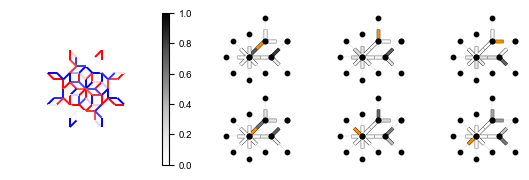

In [ ]:
%matplotlib inline
from matplotlib.gridspec import GridSpec

figsize = (18.3*cm, 5*cm)
fig = plt.figure(figsize=figsize)

num_columns = 5
gs = GridSpec(2, num_columns)  # 2 rows, n columns


dimer_width = 2
dw_eps = 0.5
l_width = 0.1
ncolor = 'black'
nsize = 10
ccolor = 'darkorange'


k = 2
for (cond_loc, state) in [('3NE', 3), ('3NE', 2), ('3NE', 1)]:
    cond8 = False

    CGfilter_corrr = create_sample_filter(cond_loc)
    freqs_filtered_all = filter_all_vertices(state, CGfilter_corrr, cond8=cond8)

    ax = fig.add_subplot(gs[0, k])
    construct_correlation_graph(freqs_filtered_all, cond8=cond8, 
                                ax=ax, 
                                dimer_width=dimer_width,
                                dw_eps=dw_eps,
                                l_width=l_width,
                                ncolor=ncolor,
                                nsize=nsize,
                                ccolor=ccolor)
    k += 1



k = 2
for (cond_loc, state) in [('8', 2), ('8', 4), ('8', 6)]:
    cond8 = True

    CGfilter_corrr = create_sample_filter(cond_loc)
    freqs_filtered_all = filter_all_vertices(state, CGfilter_corrr, cond8=cond8)

    ax = fig.add_subplot(gs[1, k])
    construct_correlation_graph(freqs_filtered_all, cond8=cond8,
                                ax=ax, 
                                dimer_width=dimer_width,
                                dw_eps=dw_eps,
                                l_width=l_width,
                                ncolor=ncolor,
                                nsize=nsize,
                                ccolor=ccolor)
    k += 1

fid = 1
ax = fig.add_subplot(gs[:, 0:2])
ax.set_aspect('equal')
ax.margins(0.4, 0.4)
a = np.array([[0, 1]])
im = plt.imshow(a, cmap="Greys")
plt.gca().set_visible(False)

fig.colorbar(im, ax=fig.get_axes()[6])




fid = 1
ax = fig.add_subplot(gs[:, 0:2])
ax.set_aspect('equal')
ax.margins(0.4, 0.4)
nx.draw(R, pos_V, node_color='black',
        node_size=0,
        edge_color=-np.array(ecolors)[:, fid],
        edge_cmap=plt.get_cmap('bwr'),
        width=0.7*dimer_width,
        edge_vmin=-np.max(edge_densities[: fid]),
        edge_vmax=np.max(edge_densities[: fid]))



plt.subplots_adjust(wspace=0.1, hspace=0.1)

plt.savefig('sigma2_correlations.pdf', dpi=300, bbox_inches='tight')


[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 51, shape Vs:  (50000, 2760, 1)
[10705] 10705
Case: 51, shape Vs:  (50000, 2760, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
will now remove 00 with frequency 0.02062
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
will now remove 10 with frequency 0.04148
[797, 793, 7438]
[0.3535535 0.3535535]
[1.207107 0.707107]
[0.707107 1.207107]
[796, 46282, 792]
[0.5 0. ]
[ 1.3535535 -0.3535535]
[1.3535535 0.3535535]
[796, 797, 798, 799, 800, 801, 802, 803]
-3
[0.5 0. ]
[0.3535535 0.3535535]
[0.  0.5]
[-0.3535535  0.3535535]
[-0.5  0. ]
[-0.3535535 -0.3535535]
[ 0.  -0.5]
[ 0.3535535 -0.3535535]
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 10705
Case: 51, shape Vs:  (50000, 2760, 1)
[10705] 10705
Case: 51, shape Vs:  (50000, 2760, 1)
[10705] 10705
Case: 52, shape Vs:  (50000, 2145, 1)
[10705] 1

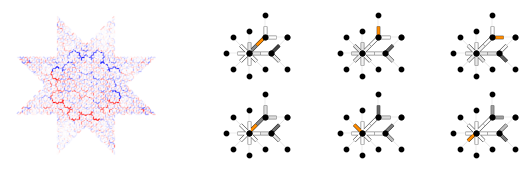

In [1703]:
%matplotlib inline

from matplotlib.gridspec import GridSpec

figsize = (18.3*cm, 5*cm)
fig = plt.figure(figsize=figsize)

num_columns = 5
gs = GridSpec(2, num_columns)  # 2 rows, n columns


dimer_width = 2
dw_eps = 0.5
l_width = 0.1
ncolor = 'black'
nsize = 10
ccolor = 'darkorange'


k = 2
for (cond_loc, state) in [('3NE', 1), ('3NE', 0), ('3NE', 3)]:
    cond8 = False

    CGfilter_corrr = create_sample_filter(cond_loc)
    freqs_filtered_all = filter_all_vertices(state, CGfilter_corrr, cond8=cond8)

    #ax = fig.add_subplot(1, num_columns, k)
    ax = fig.add_subplot(gs[0, k])
    construct_correlation_graph(freqs_filtered_all, cond8=cond8, 
                                ax=ax, 
                                dimer_width=dimer_width,
                                dw_eps=dw_eps,
                                l_width=l_width,
                                ncolor=ncolor,
                                nsize=nsize,
                                ccolor=ccolor)
    k += 1


k = 2
for (cond_loc, state) in [('8', 4), ('8', 6), ('8', 0)]:
    cond8 = True

    CGfilter_corrr = create_sample_filter(cond_loc)
    freqs_filtered_all = filter_all_vertices(state, CGfilter_corrr, cond8=cond8)

    #ax = fig.add_subplot(1, num_columns, k)
    ax = fig.add_subplot(gs[1, k])
    construct_correlation_graph(freqs_filtered_all, cond8=cond8,
                                ax=ax, 
                                dimer_width=dimer_width,
                                dw_eps=dw_eps,
                                l_width=l_width,
                                ncolor=ncolor,
                                nsize=nsize,
                                ccolor=ccolor)
    k += 1


#ax = fig.add_subplot(1, num_columns, 1)
ax = fig.add_subplot(gs[:, 0:2])
ax.set_aspect('equal')
ax.margins(0, 0)
nx.draw(R, pos_V, node_color='black',
        node_size=0,
        edge_color=np.array(ecolors)[:, 0],
        edge_cmap=plt.get_cmap('bwr'),
        width=0.45*dimer_width, edge_vmin=-np.max(edge_densities), edge_vmax=np.max(edge_densities))

plt.subplots_adjust(wspace=0.1, hspace=0.1)

plt.savefig('sigma4_correlations.pdf', dpi=300, bbox_inches='tight')


# Pickle the trained coarse grainers

In [2393]:
coarse_grainers

{'sigma2': {'8': {389: None},
  '3': {404: None,
   399: None,
   3741: None,
   7010: None,
   10286: None,
   13554: None,
   16830: None,
   20098: None}},
 'sigma4': {'8': {389: array([[ 0.27848175, -0.26871696, -1.0306501 , -0.06541156],
          [-0.3438265 , -0.22312148,  1.1347485 , -0.13245301],
          [ 0.17474516, -0.02940437, -0.1389226 ,  0.19816813],
          ...,
          [ 1.226024  ,  1.2484442 , -1.6994987 , -0.8560633 ],
          [ 0.90690744,  1.8091444 , -1.8788055 , -1.5373672 ],
          [-0.23915207, -0.09877211,  0.16043305,  0.05053719]],
         dtype=float32)},
  '3': {196: array([[-0.13640328, -0.05608476],
          [ 0.04323597, -0.02186874],
          [ 0.21450743,  0.24518093],
          ...,
          [ 0.80195427,  0.8406828 ],
          [ 0.64719915,  0.8118989 ],
          [-0.29849502, -0.1744822 ]], dtype=float32),
   274: array([[-0.08145602,  0.13663974],
          [ 0.31478158, -0.4130588 ],
          [-0.06935263, -0.05845866],
      

In [2394]:
with open('sigma4_coarsegrainers.pickle', 'wb') as handle:
    pickle.dump(coarse_grainers, handle, protocol=pickle.HIGHEST_PROTOCOL)

with open('sigma4_coarsegrainers.pickle', 'rb') as handle:
    b = pickle.load(handle)

b

{'sigma2': {'8': {389: None},
  '3': {404: None,
   399: None,
   3741: None,
   7010: None,
   10286: None,
   13554: None,
   16830: None,
   20098: None}},
 'sigma4': {'8': {389: array([[ 0.27848175, -0.26871696, -1.0306501 , -0.06541156],
          [-0.3438265 , -0.22312148,  1.1347485 , -0.13245301],
          [ 0.17474516, -0.02940437, -0.1389226 ,  0.19816813],
          ...,
          [ 1.226024  ,  1.2484442 , -1.6994987 , -0.8560633 ],
          [ 0.90690744,  1.8091444 , -1.8788055 , -1.5373672 ],
          [-0.23915207, -0.09877211,  0.16043305,  0.05053719]],
         dtype=float32)},
  '3': {196: array([[-0.13640328, -0.05608476],
          [ 0.04323597, -0.02186874],
          [ 0.21450743,  0.24518093],
          ...,
          [ 0.80195427,  0.8406828 ],
          [ 0.64719915,  0.8118989 ],
          [-0.29849502, -0.1744822 ]], dtype=float32),
   274: array([[-0.08145602,  0.13663974],
          [ 0.31478158, -0.4130588 ],
          [-0.06935263, -0.05845866],
      

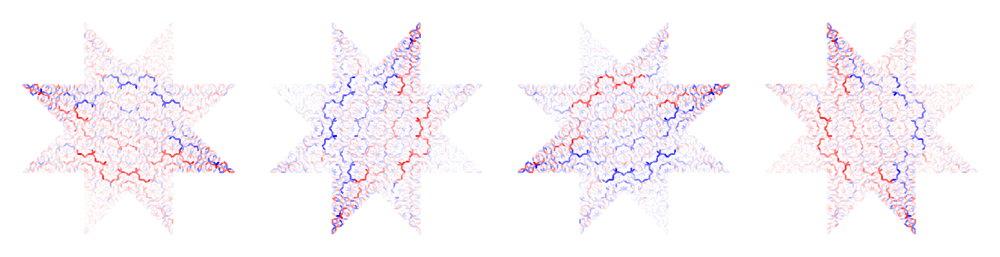

In [2392]:
small_V_visualize(cGV_edges[EV_params['case_no']], coarse_grainers['sigma4']['8'][389], edges=edges, nodes=nodes, nodepos=nodepos,
                  n_rows=1, n_cols=hidden_dim, figsize=(hidden_dim*scale_fac, 3*scale_fac), title="hidden", width=16)


In [2186]:
#with open('sigma4_coarsegrainers.pickle', 'rb') as handle:
#    coarse_grainers = pickle.load(handle)
